In [1]:
import matplotlib
import matplotlib.pyplot as plt
import rasterio
import numpy as np
import os
import sys
sys.path.append('/home/esther/lc-mapping/scripts')
import landcover_definitions as lc
import util
from importlib import reload

# important for changing fonts in 
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sys.path.append('..')
import run_model_forward_and_produce_tifs as run_model

In [2]:
classes_keep = [1,2,3,4,6]

def reindex_ea(array_in, classes_keep):
    ignore_index = len(classes_keep)
    reindex_map = dict(zip(classes_keep, np.arange(len(classes_keep))))
    # reindex shrub to tree
    tree_idx = 3 # tree idx is 3 when there are no zeros
    shrub_idx = 5
    reindexed_mask = -1 * np.ones(array_in.shape)
    for old_idx, new_idx in reindex_map.items():
        reindexed_mask[array_in == old_idx] = new_idx

    reindexed_mask[reindexed_mask == -1] = ignore_index

    return reindexed_mask

colors = [lc.lc_colors['enviroatlas'][c] for c in classes_keep]

In [3]:
states = ['pittsburgh_pa-2010_1m',
          'durham_nc-2012_1m',
          'austin_tx-2012_1m', 
          'phoenix_az-2010_1m'
         ]

state_names = {'pittsburgh_pa-2010_1m':'Pittsburgh, PA',
               'durham_nc-2012_1m': 'Durham, NC',
              'austin_tx-2012_1m': 'Austin, TX',
              'phoenix_az-2010_1m': 'Phoenix, AZ'}

tile_ids_to_plot = {'phoenix_az-2010_1m': [4],
                    'durham_nc-2012_1m': [1],
                    'austin_tx-2012_1m': [2],
                    'pittsburgh_pa-2010_1m': [4]}

plot_bounds_states = { 'phoenix_az-2010_1m': [[2000,2500,1300,1800]],
                       'durham_nc-2012_1m': [[3000,3500,1500,2000]],
                       'austin_tx-2012_1m': [[2800,3300,1300,1800]],
                      'pittsburgh_pa-2010_1m': [[500,1000,500,1000]]}



# save q and r as npy so you don't have to recompute every time

In [19]:
for s,state in enumerate(states):
    
    print(state)
    
    tile_ids = np.unique([x[:10] for x in os.listdir(f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/')])

    
    for t, tile_id_idx in enumerate(tile_ids_to_plot[state]):
        tile_id = tile_ids[tile_id_idx]
        
        h1, h2, w1, w2 = plot_bounds_states[state][t]

        image_fn = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_a_naip.tif'
        learned_prior_fn = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_prior_learned_101_31.tif'
        prior_fn  = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_prior_from_cooccurrences_101_31.tif'
       # label_fn = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_h_highres_labels.tif'

       #        model_identifier_w_prior = 'pittsburgh_pa-2010_1m_fcn_0.001_nll_with_prior'
        
        # qr from handmade prior
        model_identifier_handmade_prior = f'pa_checkpoint_{state}_fcn_1e-05_qr_forward_from_cooccurrences_101_31_additive_smooth_0.0001_prior_smooth_0.0001'

        pittburgh_model_with_prior_fn = f'/home/esther/torchgeo_predictions/{model_identifier_handmade_prior}/enviroatlas/{state}-test_tiles-debuffered/' + \
                   f'{tile_id}_qr_forward_pred_last.tif'
        
        #h1, h2, w1, w2 = 200,400, 2800, 3000
        model_ckpt_dir = '/home/esther/torchgeo/output/ea_from_pittsburgh_model'
        model_ckpt_fp = os.path.join(model_ckpt_dir, model_identifier_handmade_prior, 'last.ckpt')
        q_this = run_model.run_through_tiles(model_ckpt_fp,
                                             input_fns=[image_fn],
                                             output_fns= [''],
                                             model_kwargs = {'in_channels': 4, 'classes': 5, 'num_filters': 128},
                                             return_dont_save=True)
        
        prior_this = rasterio.open(prior_fn).read()
        # normalize, add smoothing, then normalize again
        p_add_smooth = 1e-4
        prior = prior_this / prior_this.sum(0) + p_add_smooth
        prior = prior / prior.sum(axis = 0)

        z = (q_this.T / q_this.sum(axis=(1,2)) ).T
        preds_r = (prior*z) / (prior*z).sum(axis=0)
        
        np.save(f'q_from_handmade_prior_{tile_id}.npy', q_this)
        np.save(f'r_from_handmade_prior_{tile_id}.npy', preds_r)
        
        
        # qr from learned prior
        model_identifier_learned_prior = f'pa_checkpoint_{state}_fcn_1e-05_qr_forward_learned_101_31_additive_smooth_0.0001_prior_smooth_0.0001'

        pittburgh_model_with_prior_fn = f'/home/esther/torchgeo_predictions/{model_identifier_handmade_prior}/enviroatlas/{state}-test_tiles-debuffered/' + \
                   f'{tile_id}_qr_forward_pred_last.tif'
        
        #h1, h2, w1, w2 = 200,400, 2800, 3000
        model_ckpt_dir = '/home/esther/torchgeo/output/ea_learned_prior'
        model_ckpt_fp = os.path.join(model_ckpt_dir, model_identifier_learned_prior, 'last.ckpt')
        q_this = run_model.run_through_tiles(model_ckpt_fp,
                                             input_fns=[image_fn],
                                             output_fns= [''],
                                             model_kwargs = {'in_channels': 4, 'classes': 5, 'num_filters': 128},
                                             return_dont_save=True)
        
        prior_this = rasterio.open(learned_prior_fn).read()
        # normalize, add smoothing, then normalize again
        p_add_smooth = 1e-4
        prior = prior_this / prior_this.sum(0) + p_add_smooth
        prior = prior / prior.sum(axis = 0)

        z = (q_this.T / q_this.sum(axis=(1,2)) ).T
        preds_r = (prior*z) / (prior*z).sum(axis=0)
        
        np.save(f'q_from_learned_prior_{tile_id}.npy', q_this)
        np.save(f'r_from_learned_prior_{tile_id}.npy', preds_r)
        
        

pittsburgh_pa-2010_1m
0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


durham_nc-2012_1m
0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


austin_tx-2012_1m
0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


phoenix_az-2010_1m
0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


0 of 1


[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)
[W pthreadpool-cpp.cc:90] Warning: Leaking Caffe2 thread-pool after fork. (function pthreadpool)


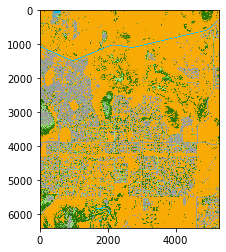

In [11]:
plt.imshow(lc.vis_lc_from_colors(q_this, colors).T.swapaxes(0,1),interpolation='none')

# make the mosaic figure

pittsburgh_pa-2010_1m


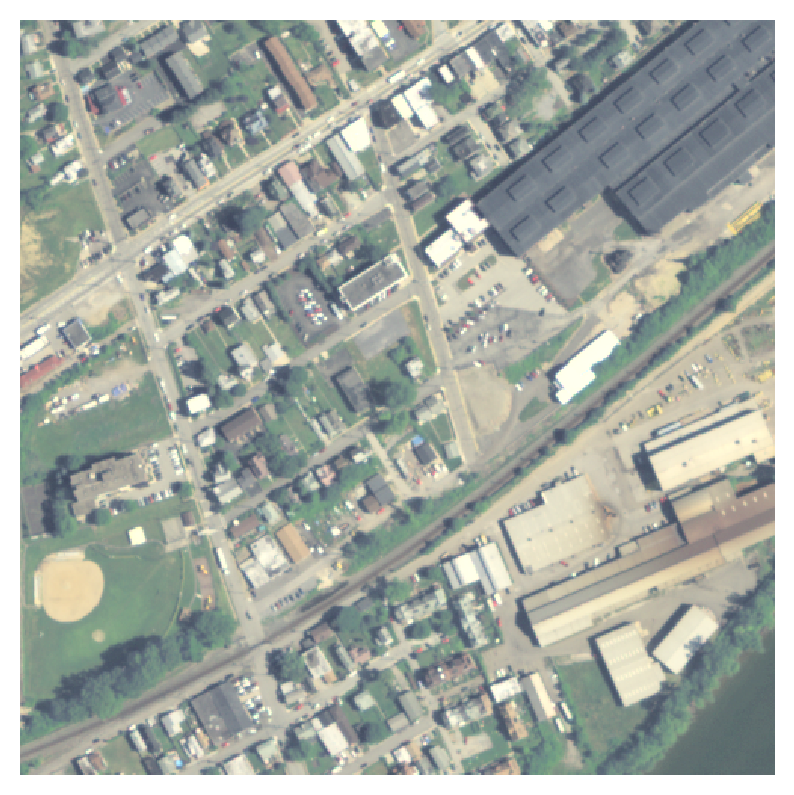

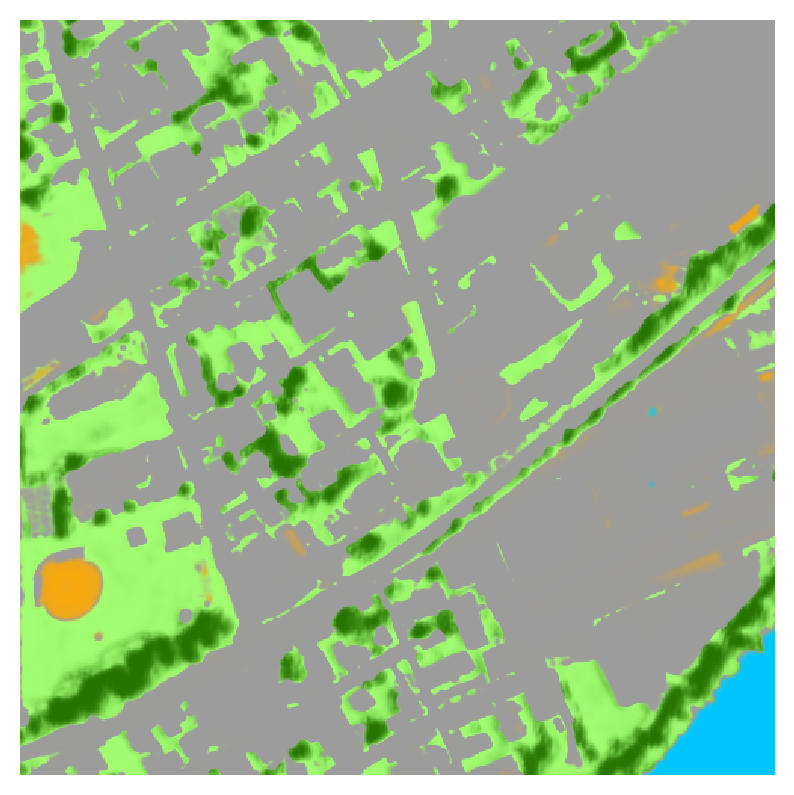

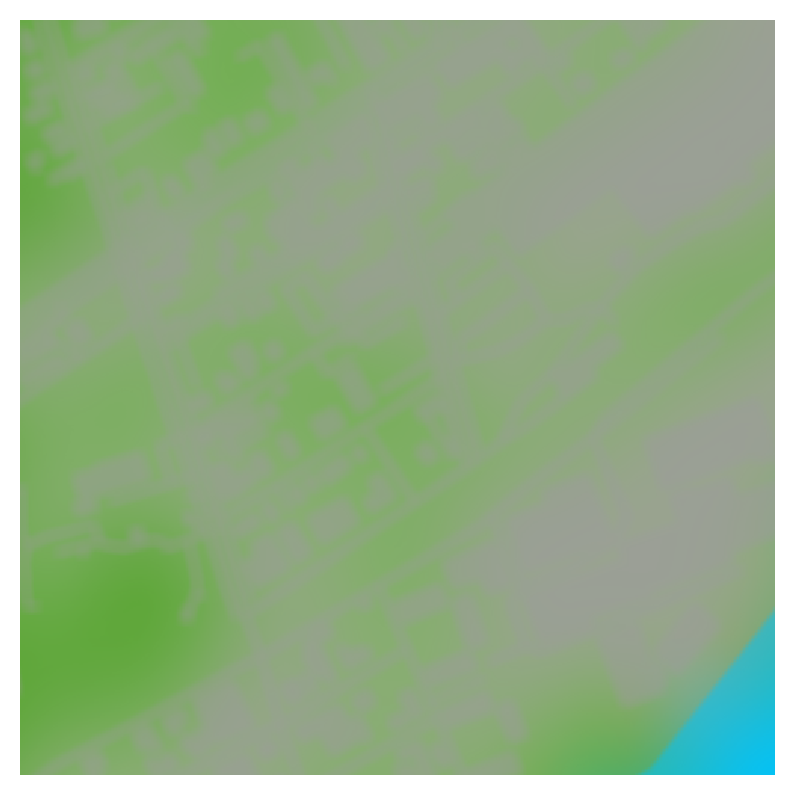

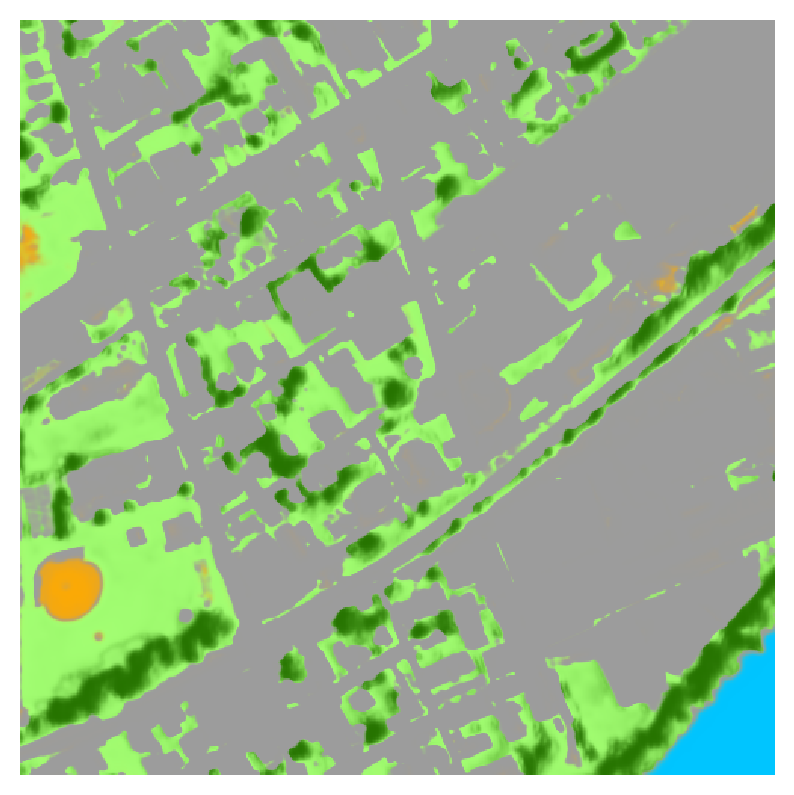

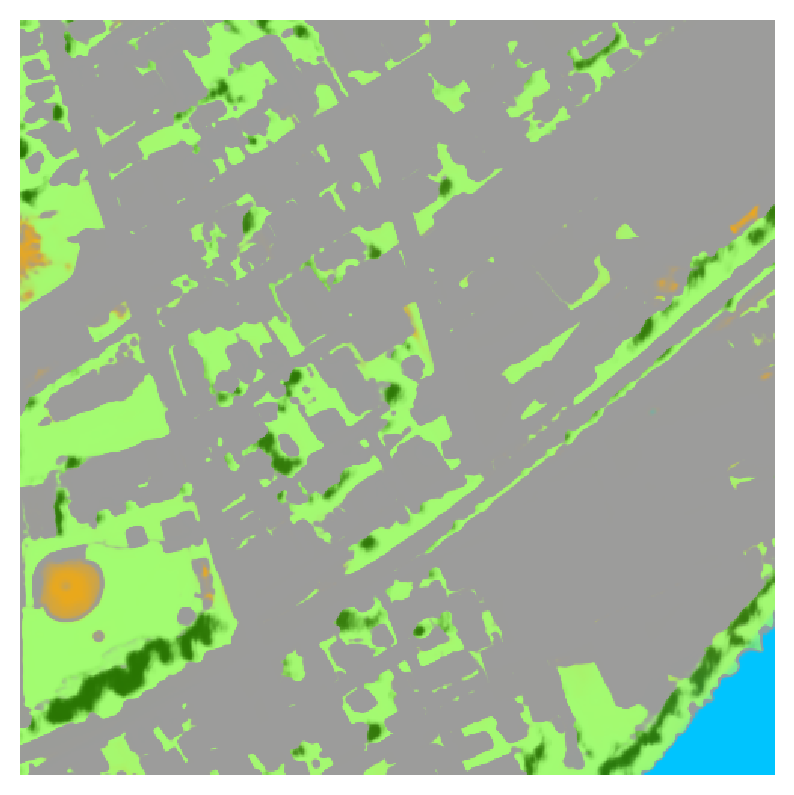

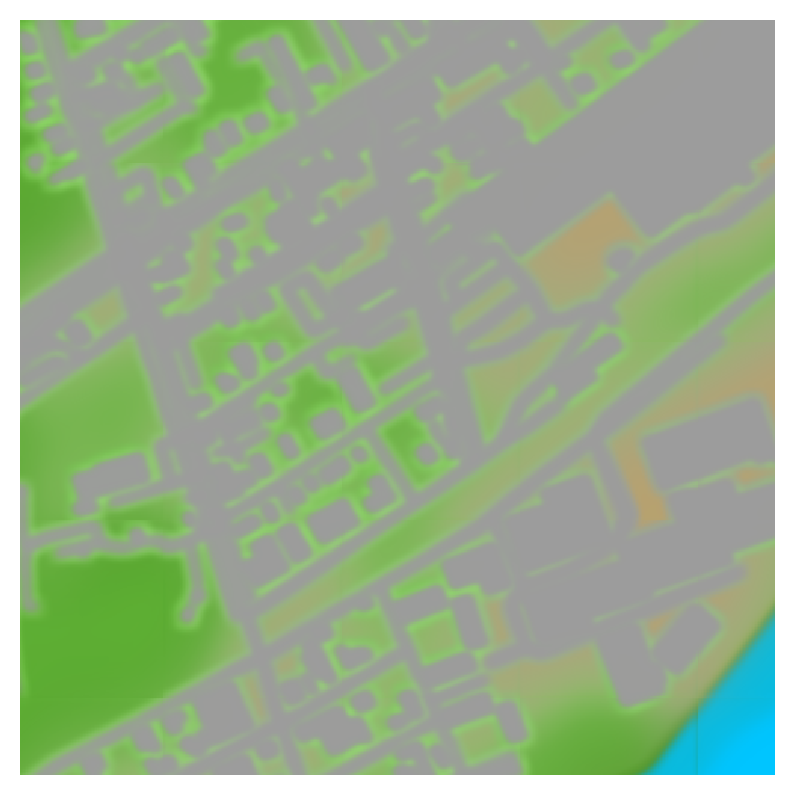

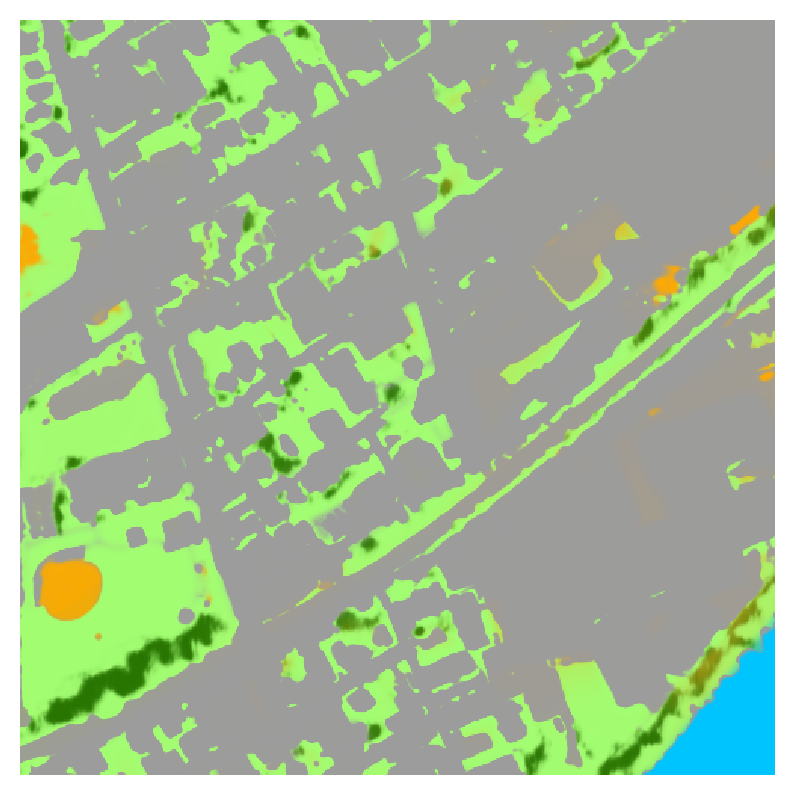

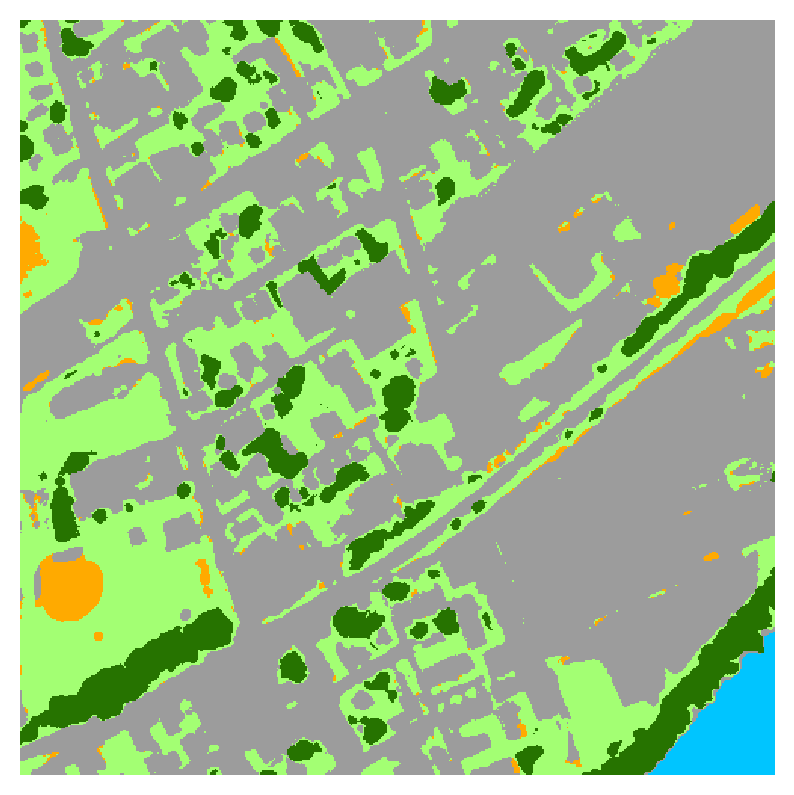

durham_nc-2012_1m


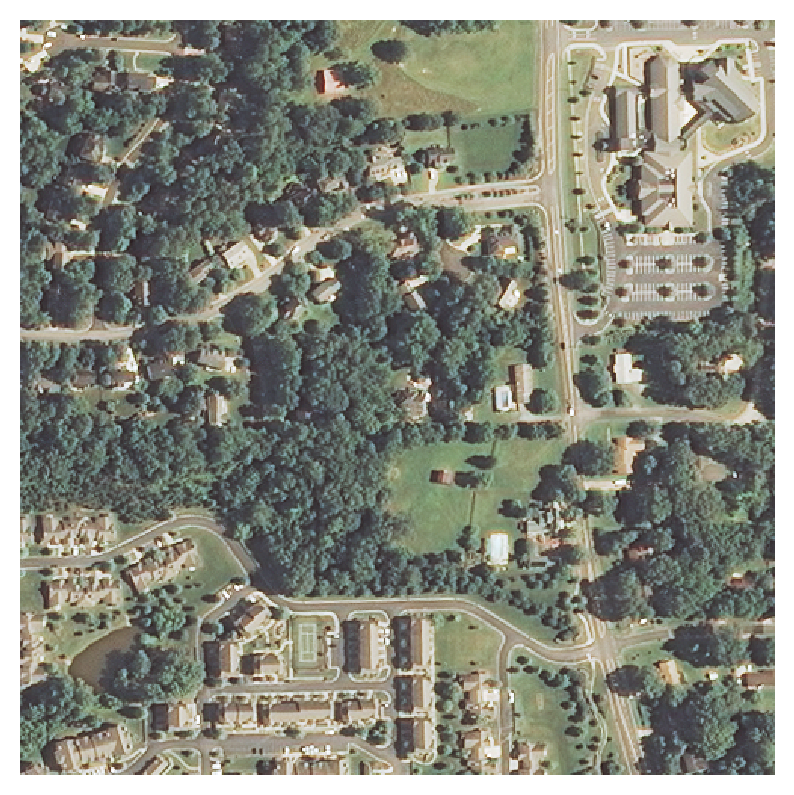

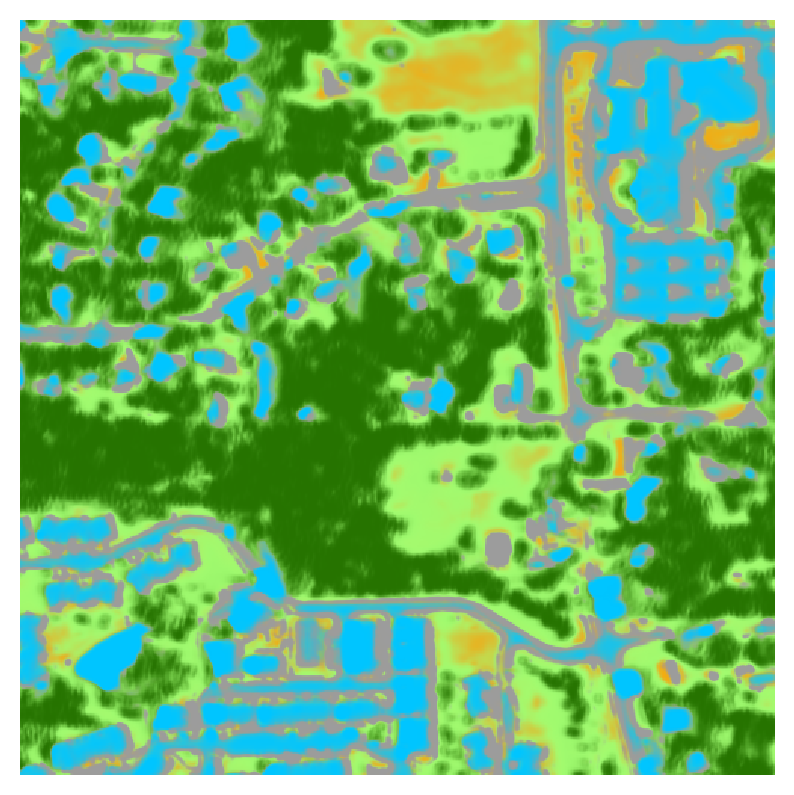

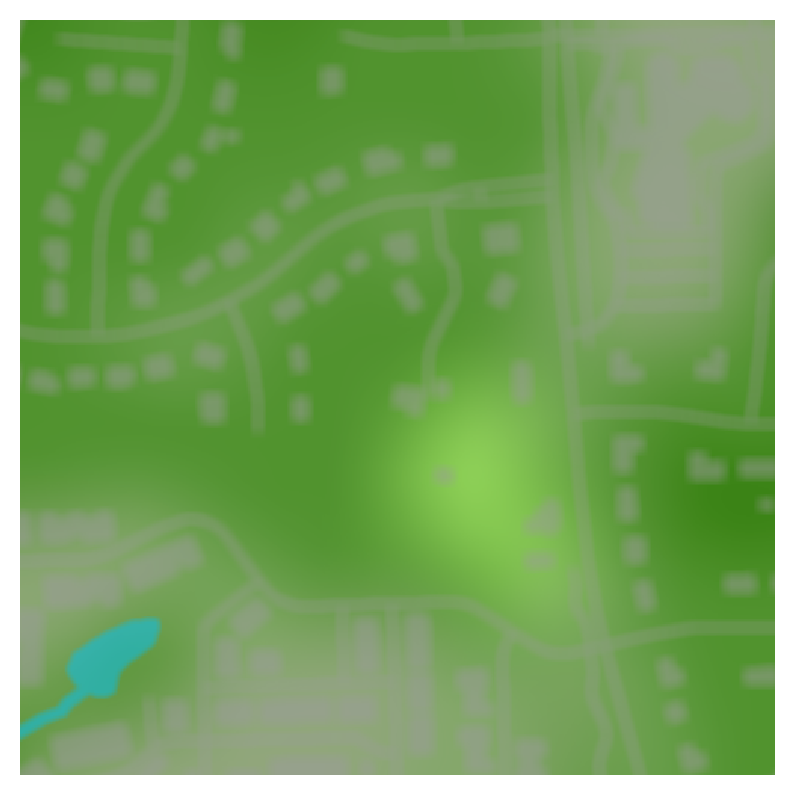

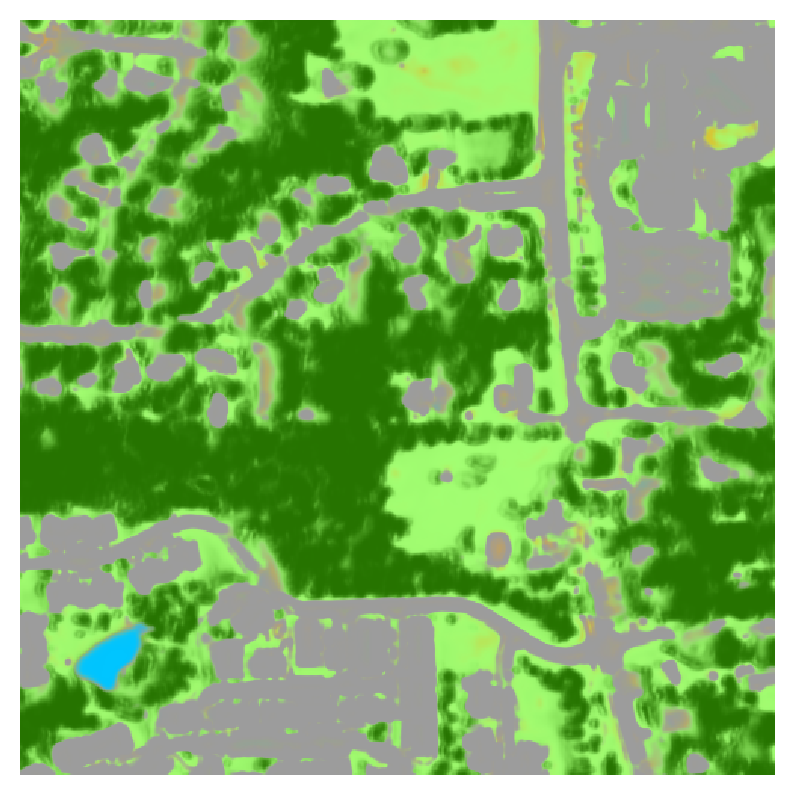

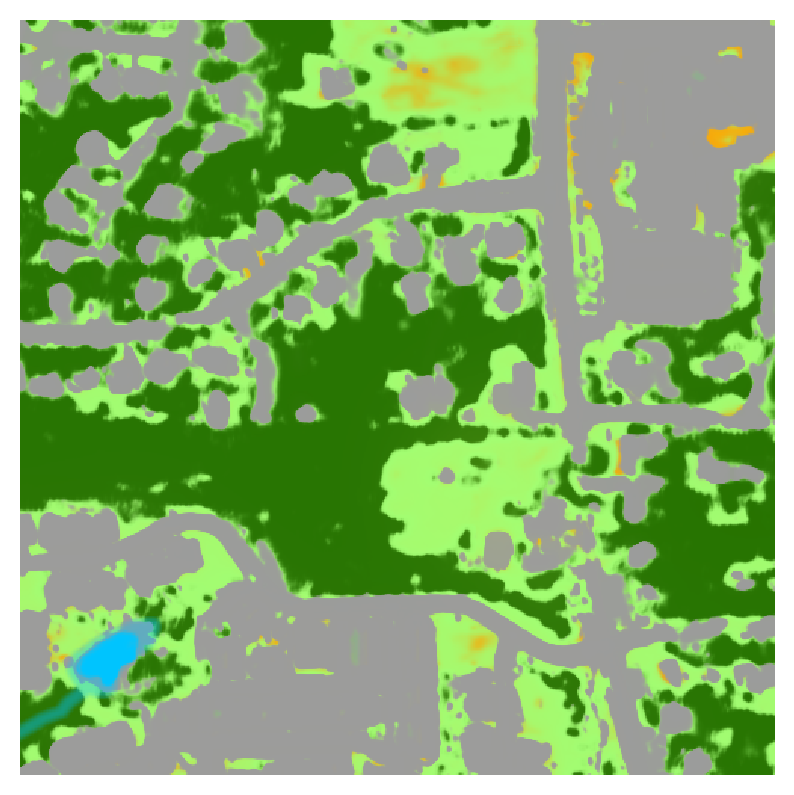

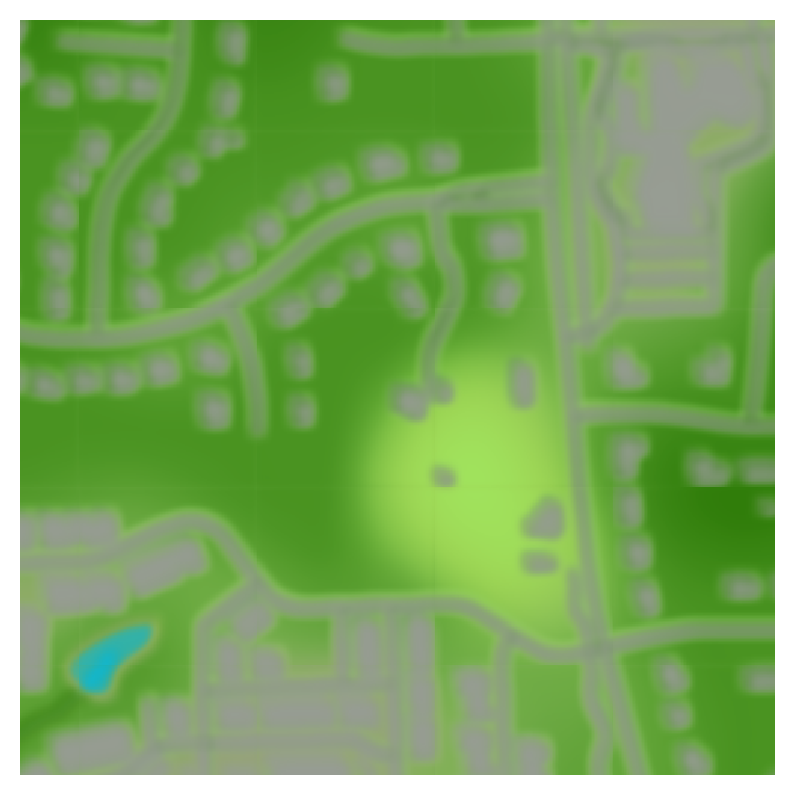

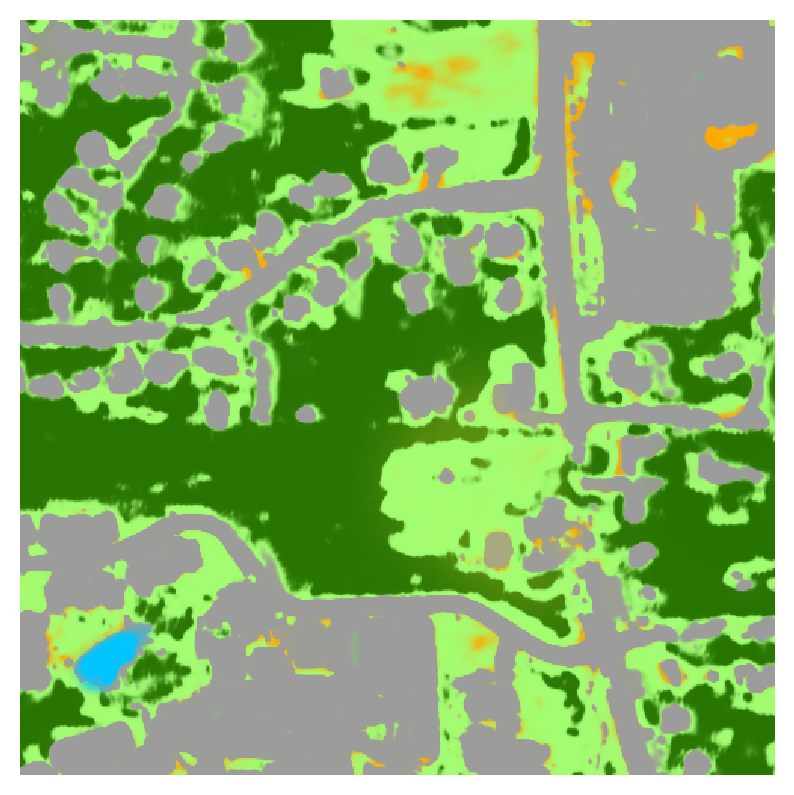

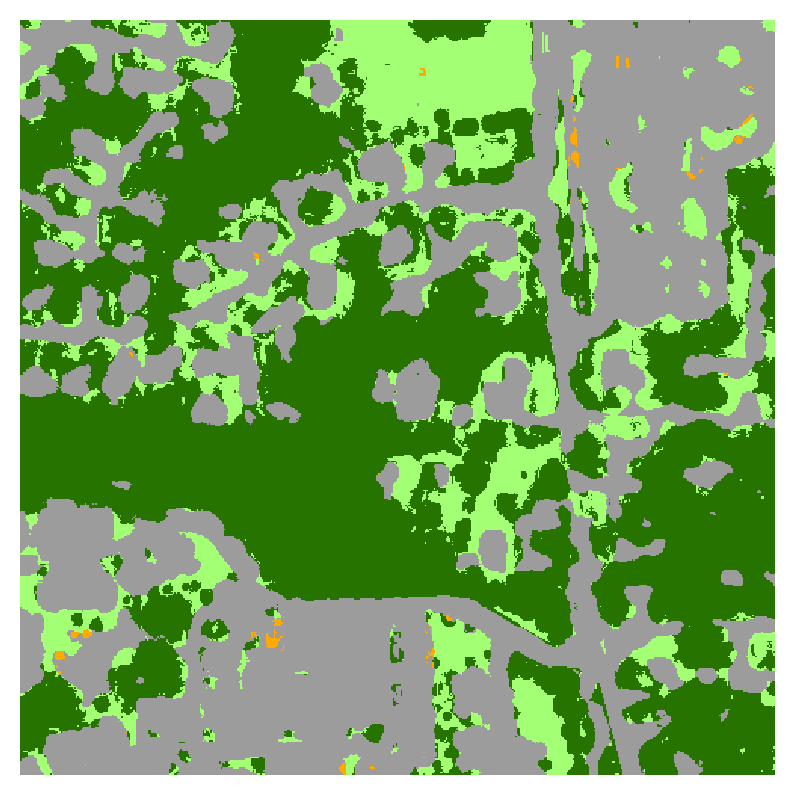

austin_tx-2012_1m


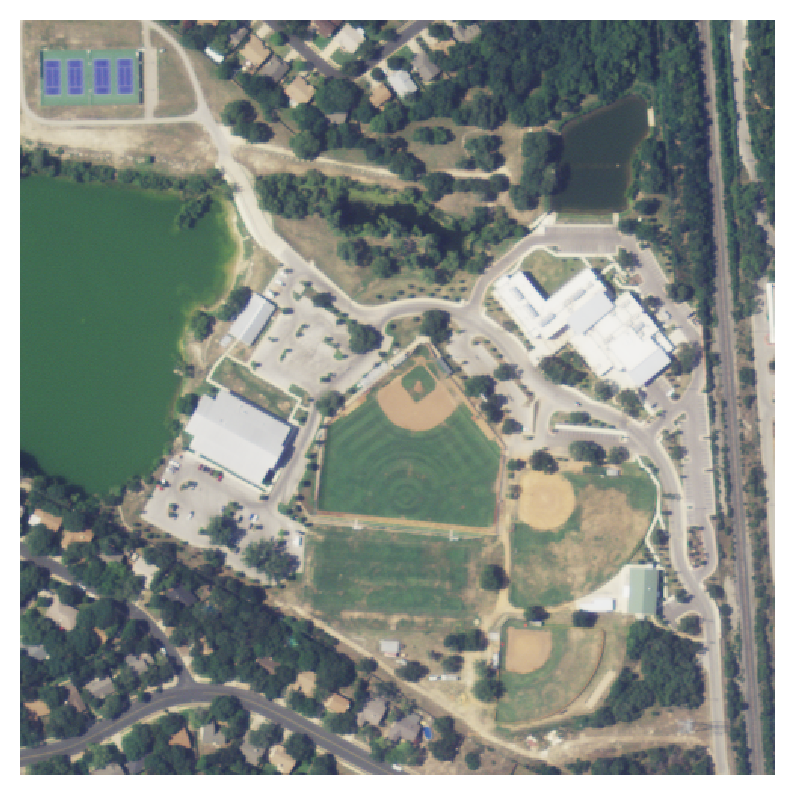

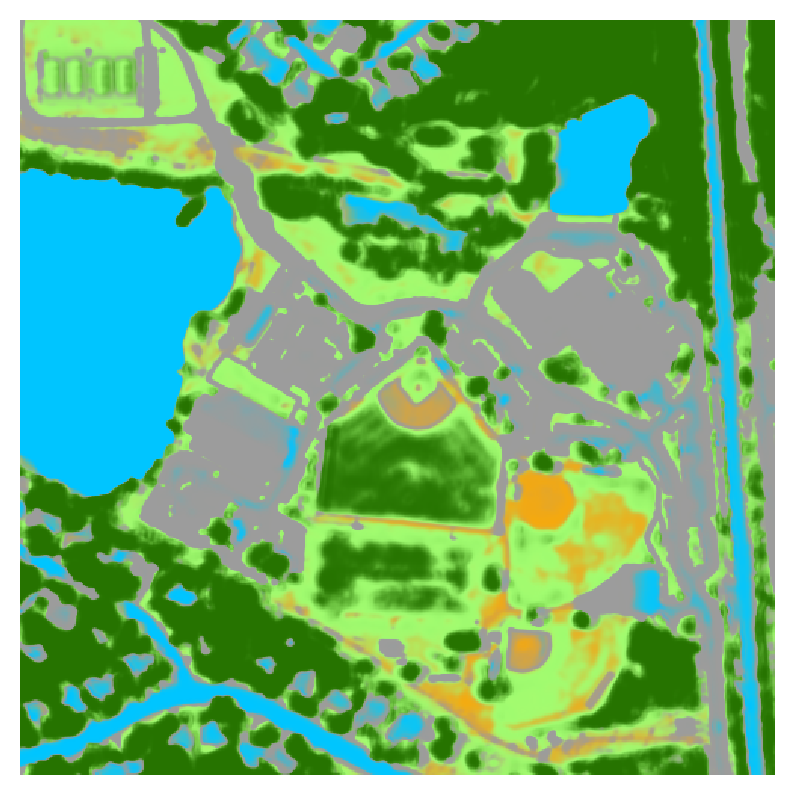

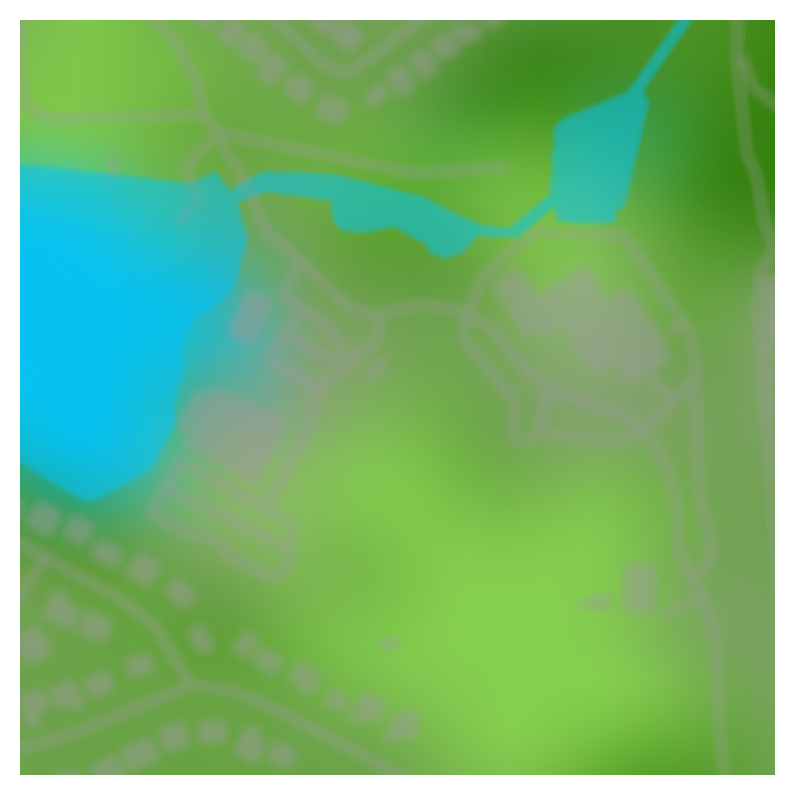

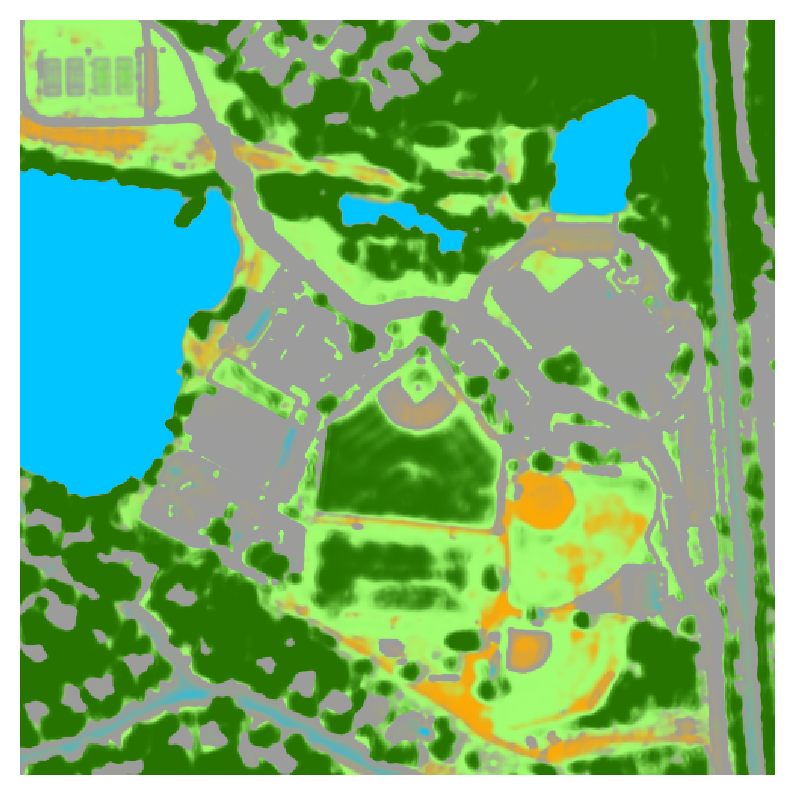

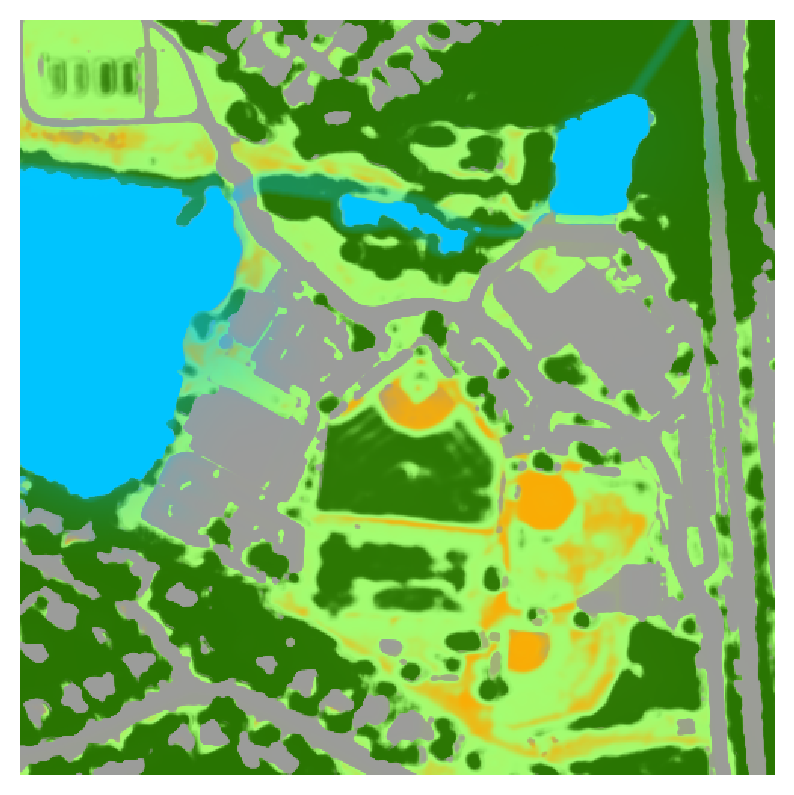

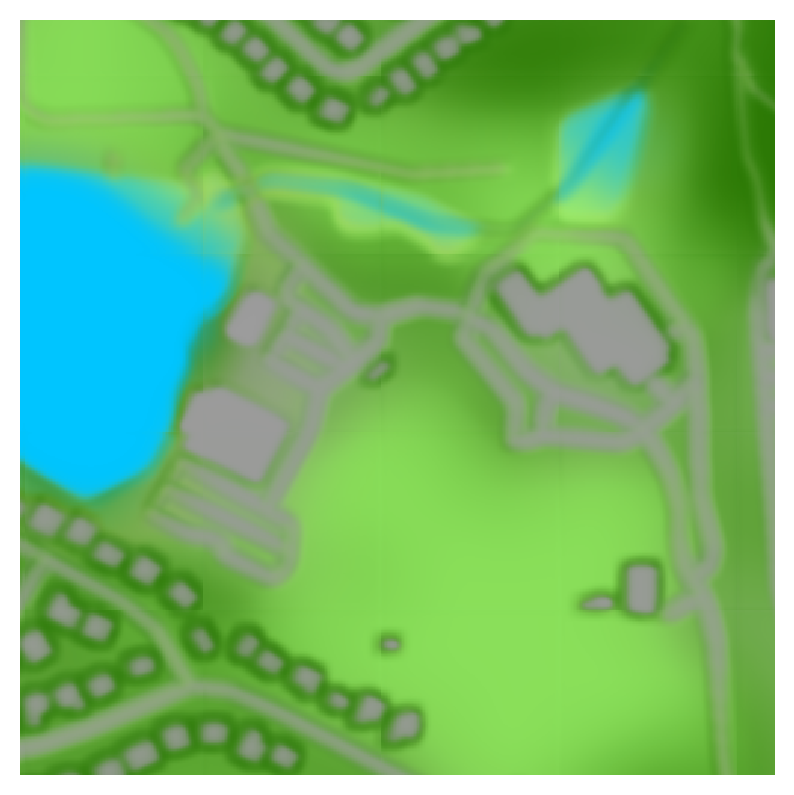

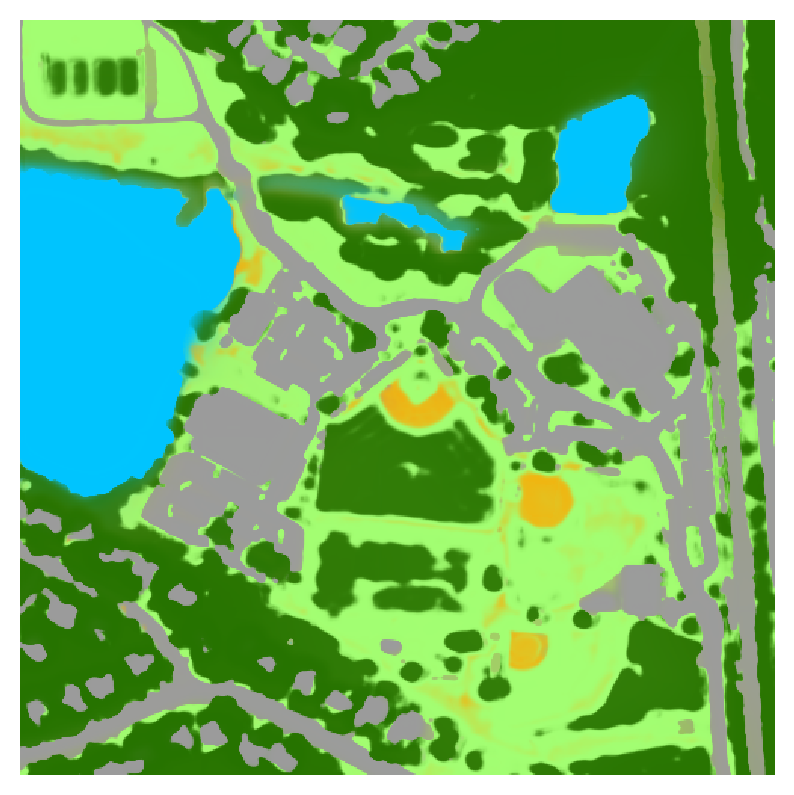

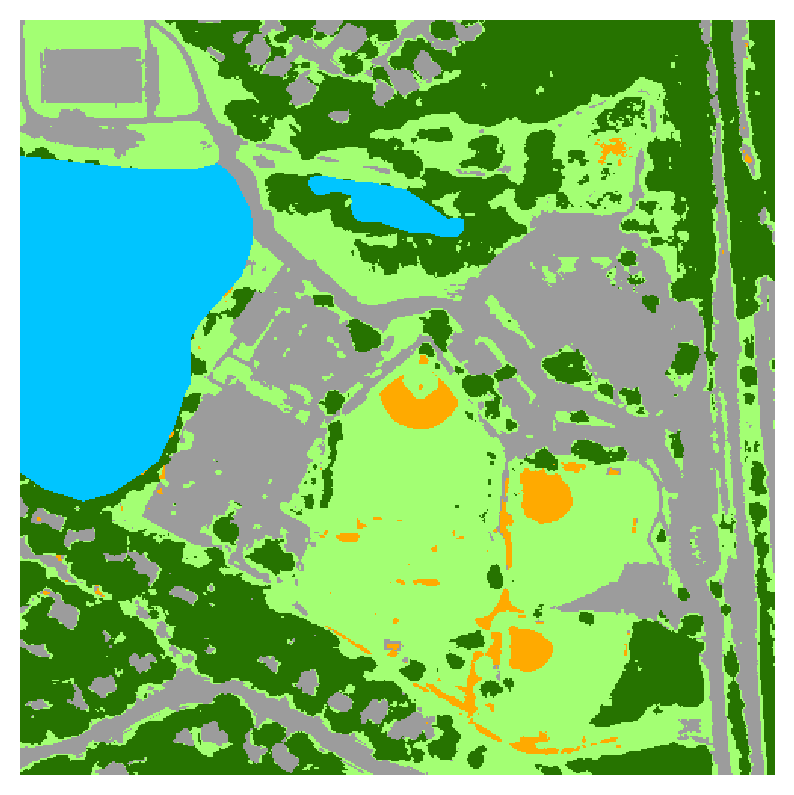

phoenix_az-2010_1m


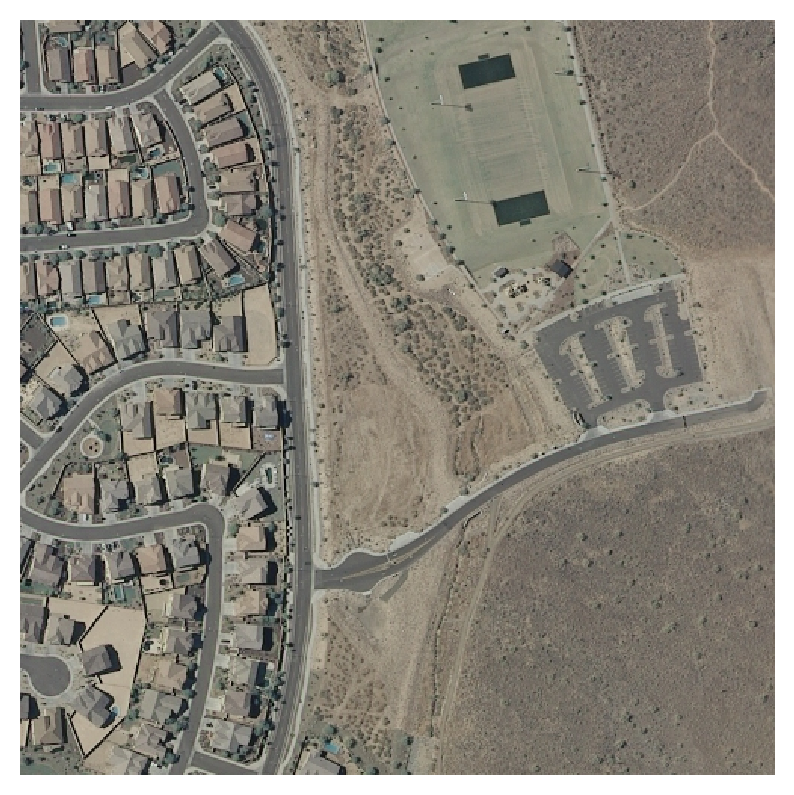

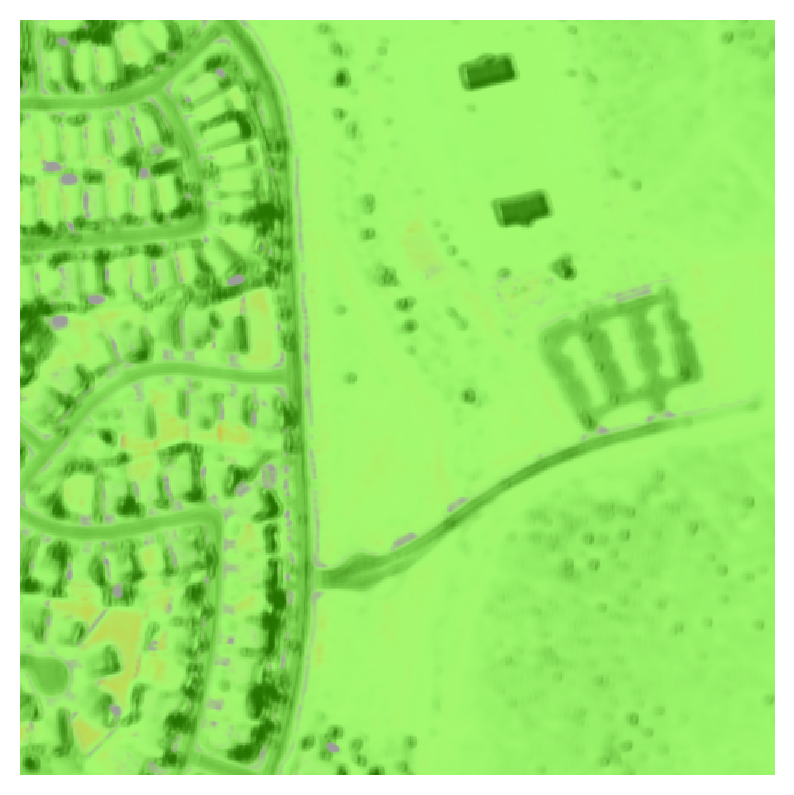

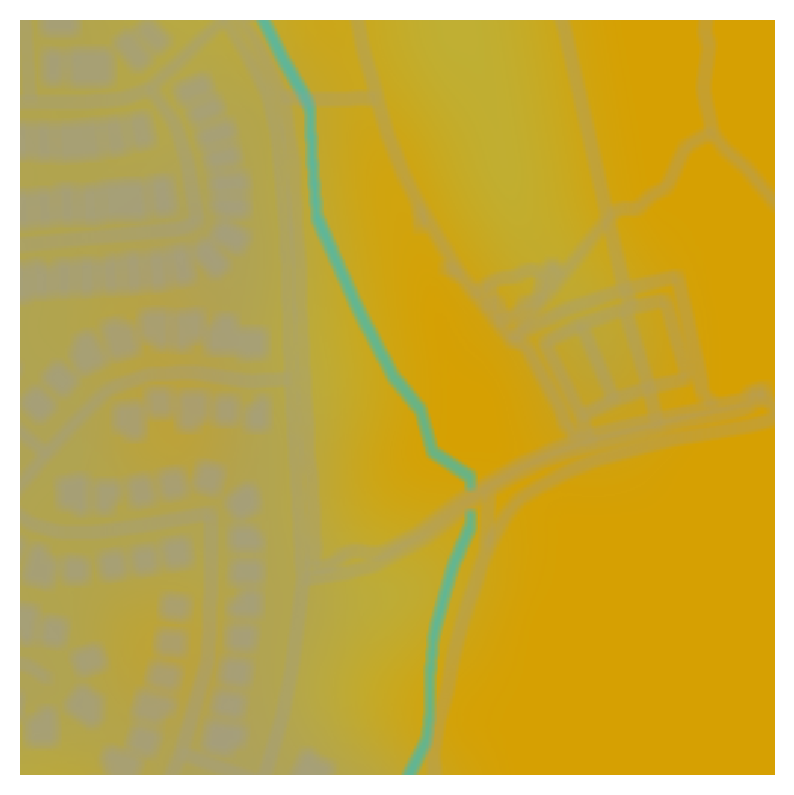

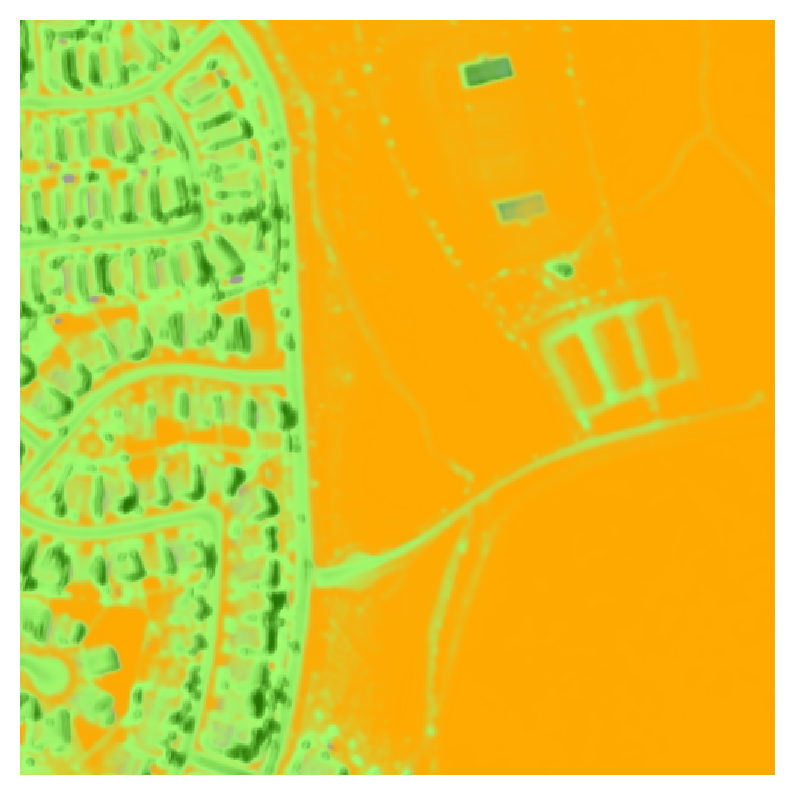

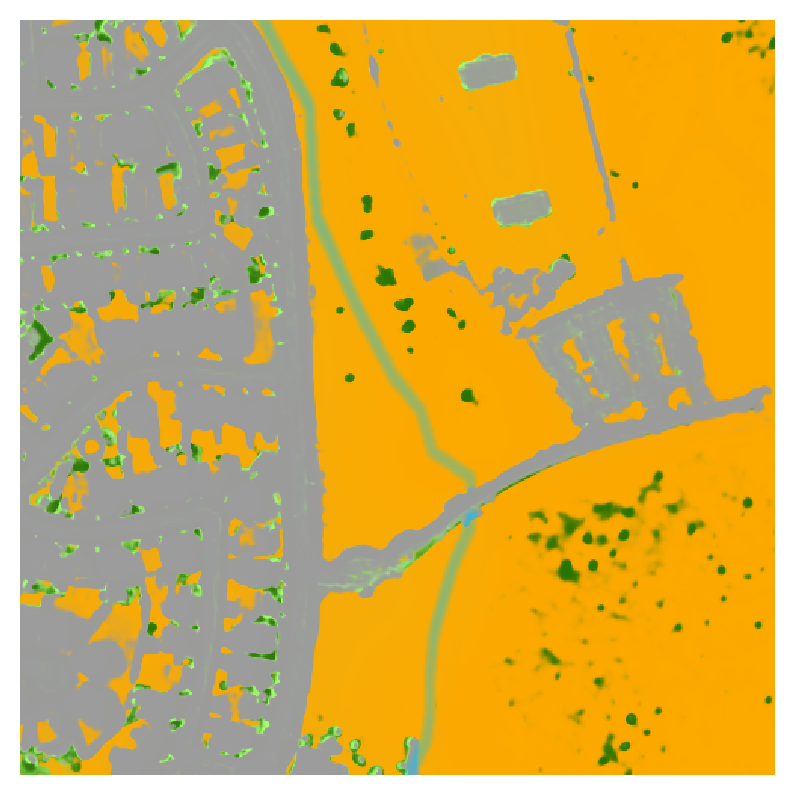

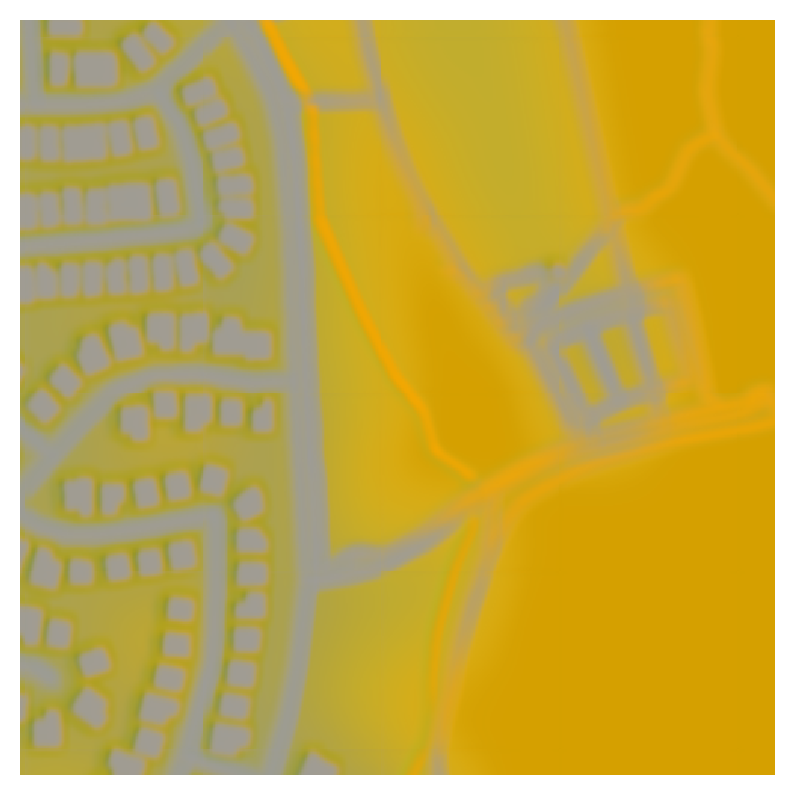

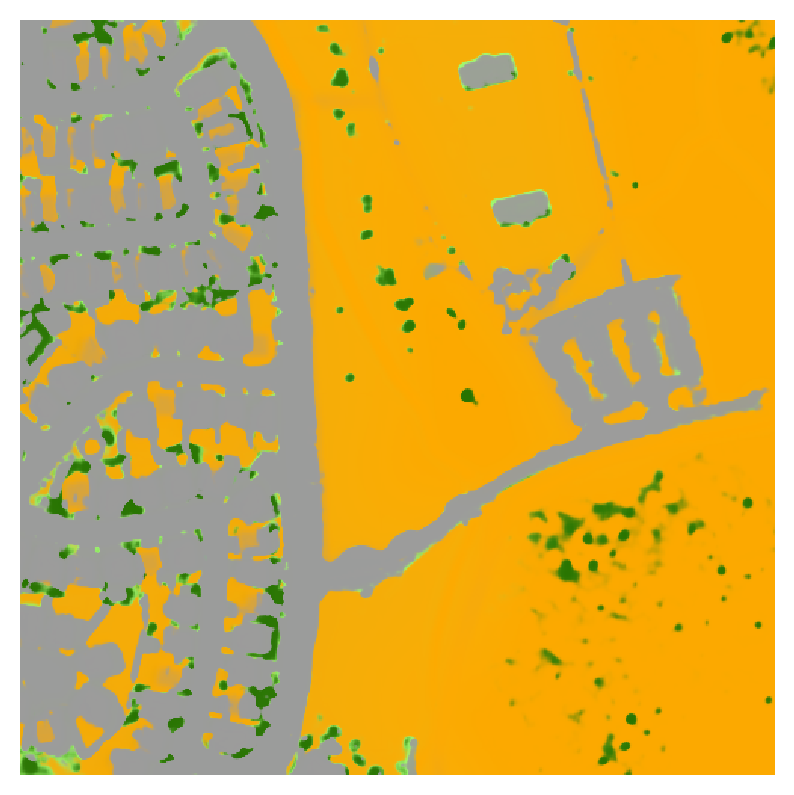

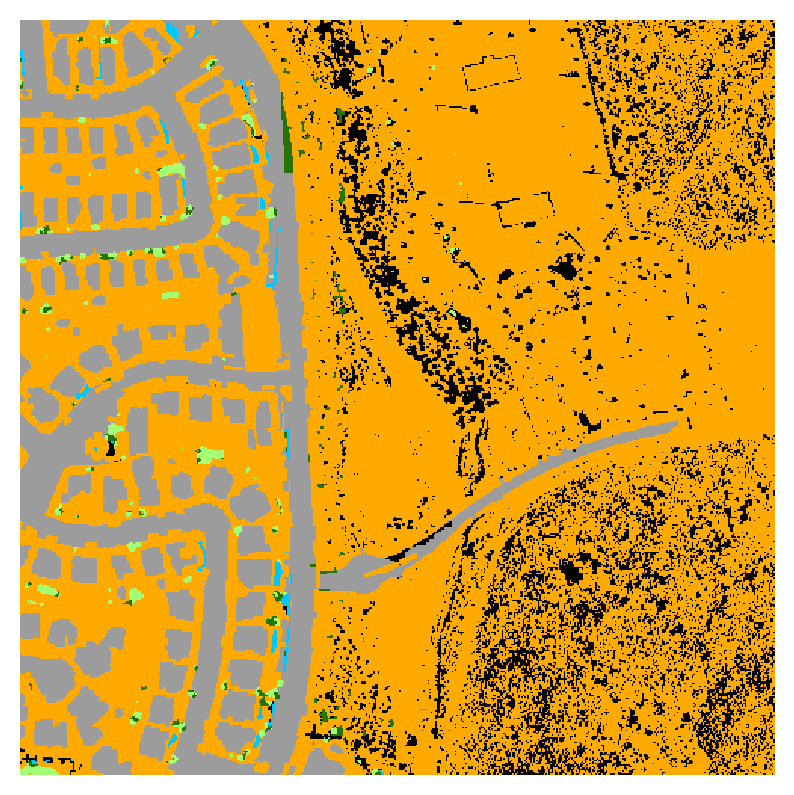

In [7]:
reload(lc)

#states = []



for s,state in enumerate(states):
    
    print(state)
    
    tile_ids = np.unique([x[:10] for x in os.listdir(f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/')])

    
    for t, tile_id_idx in enumerate(tile_ids_to_plot[state]):
        tile_id = tile_ids[tile_id_idx]
        
        h1, h2, w1, w2 = plot_bounds_states[state][t]

        image_fn = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_a_naip.tif'
        learned_prior_fn = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_prior_learned_101_31.tif'
        prior_fn  = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_prior_from_cooccurrences_101_31.tif'
        label_fn = f'/home/esther/torchgeo_data/enviroatlas/{state}-test_tiles-debuffered/{tile_id}_h_highres_labels.tif'

        prior_no_osm_fn = prior_fn.replace('.tif', '_no_osm_no_buildings.tif')
        nlcd_fn = image_fn.replace('a_naip', 'b_nlcd')
        roads_fn = image_fn.replace('a_naip', 'c_roads')
        buildings_fn = image_fn.replace('a_naip', 'e_buildings')
        waterways_fn = image_fn.replace('a_naip', 'd1_waterways')
        waterbodies_fn = image_fn.replace('a_naip', 'd2_waterbodies')
        
        preds_pit = image_fn.replace('a_naip', 'd2_waterbodies')
        waterbodies_fn = image_fn.replace('a_naip', 'd2_waterbodies')
        
        model_identifier = 'pittsburgh_pa-2010_1m_fcn_0.001_nll'
        pittburgh_model_fn = f'/home/esther/torchgeo_predictions/{model_identifier}/enviroatlas/{state}-test_tiles-debuffered/' + \
                   f'{tile_id}_qr_forward_pred_last.tif'
        
        model_identifier_w_prior = 'pittsburgh_pa-2010_1m_fcn_0.001_nll_with_prior'
        pittburgh_model_with_prior_fn = f'/home/esther/torchgeo_predictions/{model_identifier_w_prior}/enviroatlas/{state}-test_tiles-debuffered/' + \
                   f'{tile_id}_qr_forward_pred_last.tif'
        
        #h1, h2, w1, w2 = 200,400, 2800, 3000
        
        
        prior_no_osm = rasterio.open(prior_no_osm_fn).read()[:,h1:h2,w1:w2]

        nlcd = rasterio.open(nlcd_fn).read()[0,h1:h2,w1:w2]
    #    waterways = util.blur(rasterio.open(waterways_fn).read()[0,h1:h2,w1:w2], 1)
    #    waterbodies = rasterio.open(waterbodies_fn).read()[0,h1:h2,w1:w2]
    #    buildings = rasterio.open(buildings_fn).read()[0,h1:h2,w1:w2]
   #     roads = rasterio.open(roads_fn).read()[0,h1:h2,w1:w2]
   #     built = np.maximum(buildings, roads)
   #     water = np.maximum(waterways, waterbodies)
         
        impervious_idx = 2
        water_idx = 1
#         osm_data = np.zeros(water.shape)
#         osm_data[water > 0 ] = water_idx
#         osm_data[built > 0] = impervious_idx

#         osm_data = np.zeros(water.shape)
#         osm_data[waterbodies > 0] = water_idx
#         osm_data[waterways > 0] = 12
#         osm_data[roads > 0] = 11
#         osm_data[buildings > 0] = impervious_idx
        
        learned_prior = rasterio.open(learned_prior_fn).read()[:,h1:h2,w1:w2]
        handmade_prior = rasterio.open(prior_fn).read()[:,h1:h2,w1:w2]
        img = rasterio.open(image_fn).read()[:,h1:h2,w1:w2]
        h = lc.map_raw_lc_to_idx['enviroatlas'][rasterio.open(label_fn).read()[0,h1:h2,w1:w2]]
        pitt_preds = rasterio.open(pittburgh_model_fn).read()[:,h1:h2,w1:w2]
        pitt_preds_w_prior = rasterio.open(pittburgh_model_with_prior_fn).read()[:,h1:h2,w1:w2]
        
        preds_r_handmade_prior = np.load(f'r_from_handmade_prior_{tile_id}.npy')[:,h1:h2,w1:w2]
        preds_r_learned_prior = np.load(f'r_from_learned_prior_{tile_id}.npy')[:,h1:h2,w1:w2]
        
        h_copy = h.copy()
        for i, cls in enumerate(classes_keep):
            h_copy[h == cls] = i

        dpi = 200
            
        t_images = [
            img[:3].T.swapaxes(0,1),
            lc.vis_lc_from_colors(pitt_preds, colors).T.swapaxes(0,1),
            lc.vis_lc_from_colors(handmade_prior, colors).T.swapaxes(0,1),
            lc.vis_lc_from_colors(pitt_preds_w_prior, colors).T.swapaxes(0,1),
            lc.vis_lc_from_colors(preds_r_handmade_prior, colors).T.swapaxes(0,1),
            lc.vis_lc_from_colors(learned_prior, colors).T.swapaxes(0,1),
            lc.vis_lc_from_colors(preds_r_learned_prior, colors).T.swapaxes(0,1),
            lc.vis_lc_from_colors(h_copy, colors).T.swapaxes(0,1)
        ]
        
        t_labels = [
            "naip",
            "ht-pitt-model-predictions",
            "handcoded-prior",
            "hr-pitt-naip-prior-model-predictions",
            "r-model-handmade-prior",
            "learned-prior",
            "r-model-learned-prior",
            'enviroatlas-labels'
        ]
        
        for img, label in zip(t_images, t_labels):
            plt.figure(figsize=(5,5), dpi=dpi)
            plt.imshow(img,interpolation='none')
            plt.axis("off")
            plt.savefig(f"learned_prior_mosaic_with_predictions-patches/{state}-{tile_id_idx}-{label}.png", bbox_inches="tight")
            plt.show()
            plt.close()